In [1]:
import seaborn as sns 
import scanpy as sc
import pandas as pd
import anndata
import numpy as np   
# import episcanpy.api as epi
# import scvi
import matplotlib.pyplot as plt
import scipy
import h5py    
import scipy.sparse as sparse
import scipy.io as sio
import scipy.stats as stats

from typing import Dict, Iterable, Optional

import numpy as np
import torch
from torch.distributions import Normal, Poisson
from torch.distributions import kl_divergence as kld
from torch import tensor
from complementary_models import HALOVIR as HALOVI
from complementary_models import HALOVAER as HALOVAE
import scanpy as sc
import scvi
import pandas as pd
import scvelo as scv
import matplotlib.pyplot as plt

Global seed set to 0
/net/talisker/home/benos/mij51/.conda/envs/scvi-env/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/net/talisker/home/benos/mij51/.conda/envs/scvi-env/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
adata_multi = sc.read_h5ad("../openproblem/adata_trajectory.h5ad")
adata_multi.X = adata_multi.layers['counts']
newadata = adata_multi[adata_multi.obs['GEX_pseudotime_order'].notna()].copy()
adata_mvi = scvi.data.organize_multiome_anndatas(newadata)

adata_mvi 

AnnData object with n_obs × n_vars = 10862 × 129921
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'modality'
    var: 'feature_types', 'gene_id'
    uns: 'ATAC_gene_activity_var_names', 'cell_type_colors', 'dataset_id', 'genome', 'organism'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pca', 'GEX_X_umap'
    layers: 'counts'

In [3]:
# Reorder the categories for color consistency with the manuscript.
all_clusters = ['HSC','MK/E prog','Proerythroblast','Erythroblast','Normoblast']
adata_mvi.obs['cell_type'] = adata_mvi.obs['cell_type'].cat.reorder_categories(all_clusters)
# colors = ['#dd5129', '#427084', '#299693', '#71b278', '#fab255']
colors = ["#a82203","#208cc0","#f1af3a","#cf5e4e","#637b31"]

In [4]:
HALOVI.setup_anndata(adata_mvi, batch_key="batch", categorical_covariate_keys = ["Site", "DonorNumber"],time_key='GEX_pseudotime_order')
model = HALOVI(
    adata_mvi,
    n_genes=(adata_mvi.var['feature_types']=='GEX').sum(),
    n_regions=(adata_mvi.var['feature_types']=='ATAC').sum(),
    n_layers = 2
)

In [5]:
## train both RNA and ATAC
# import warnings
# warnings.filterwarnings("ignore")
model.module.set_train_params(expr_train=True, acc_train=True)
model.module.set_finetune_params(0)
model.train(max_epochs=20)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 20/20: 100%|██████████| 20/20 [02:31<00:00,  7.57s/it, loss=4.65e+04, v_num=1]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [02:31<00:00,  7.58s/it, loss=4.65e+04, v_num=1]


In [7]:
latent_expr, latent_acc,latent_atac_dep, latent_expr_dep, latent_atac_indep, latent_expr_indep, times  = model.get_latent_representation()

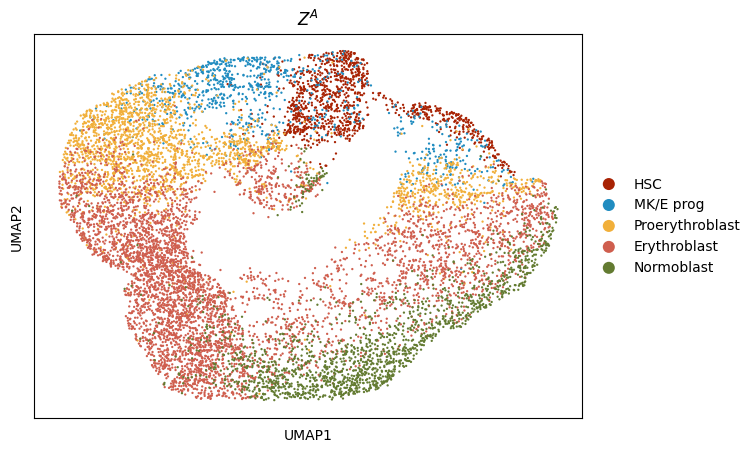

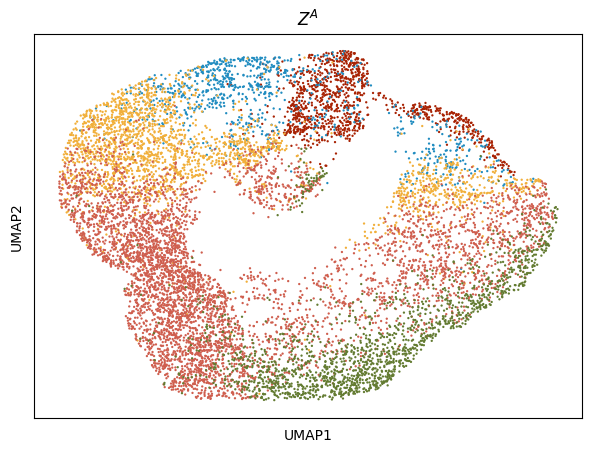

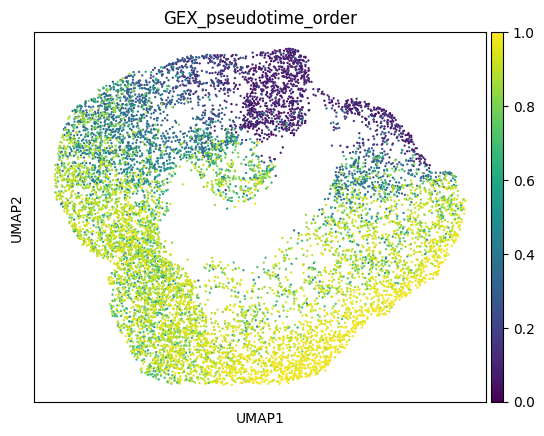

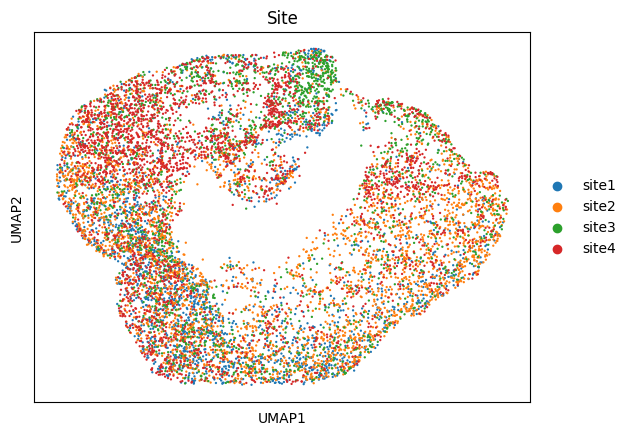

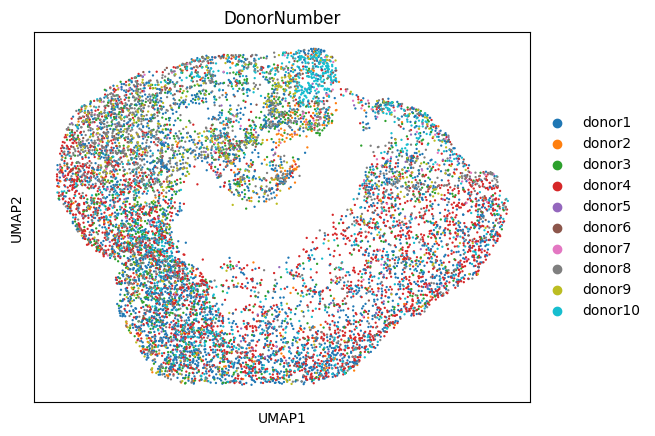

In [8]:
adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{A}$',palette=colors)
plt.show()


sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{A}$',palette=colors,legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()

sc.pl.umap(adata_mvi, color=['Site'])
plt.show()

sc.pl.umap(adata_mvi, color=['DonorNumber'])
plt.show()

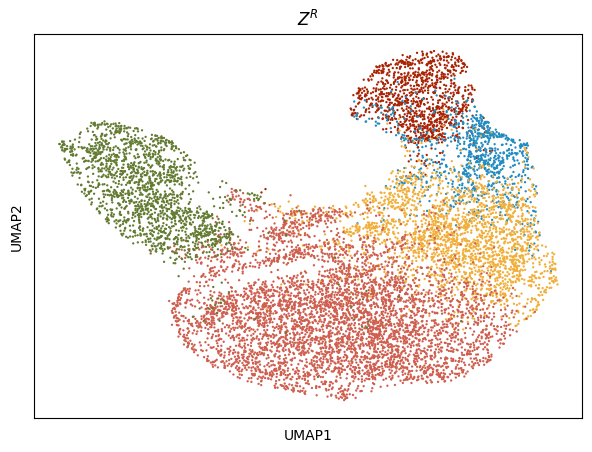

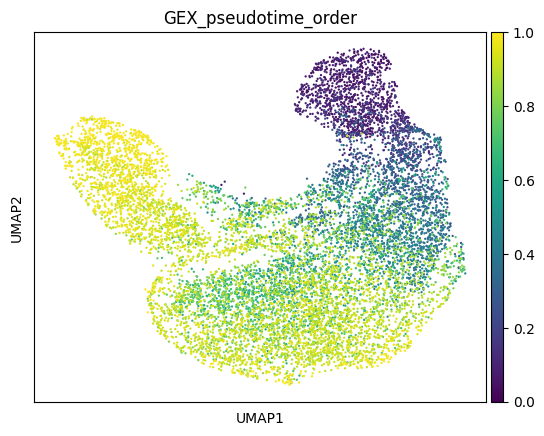

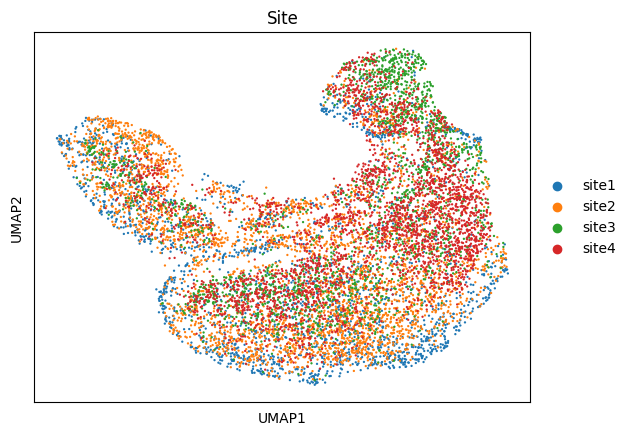

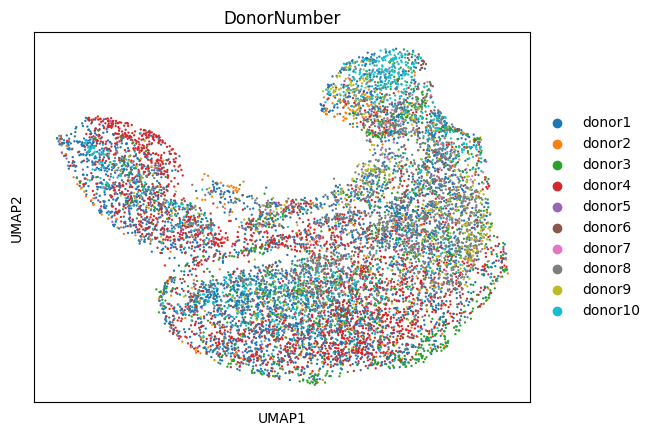

In [9]:
adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{R}$',palette=colors,legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()

sc.pl.umap(adata_mvi, color=['Site'])
plt.show()

sc.pl.umap(adata_mvi, color=['DonorNumber'])
plt.show()

In [10]:
model.module.set_train_params(expr_train=True, acc_train=False)
model.module.set_finetune_params(0)
model.train(max_epochs=10)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 10/10: 100%|██████████| 10/10 [01:14<00:00,  7.45s/it, loss=4.19e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████| 10/10 [01:14<00:00,  7.44s/it, loss=4.19e+03, v_num=1]


In [11]:
model.module.set_train_params(expr_train=False, acc_train=True)
model.module.set_finetune_params(0)
model.train(max_epochs=20)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 20/20: 100%|██████████| 20/20 [02:26<00:00,  7.38s/it, loss=1.12e+04, v_num=1]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [02:26<00:00,  7.35s/it, loss=1.12e+04, v_num=1]


In [12]:
latent_expr_1, latent_acc_1,latent_atac_dep_1, latent_expr_dep_1, latent_atac_indep_1, latent_expr_indep_1, times  = model.get_latent_representation()

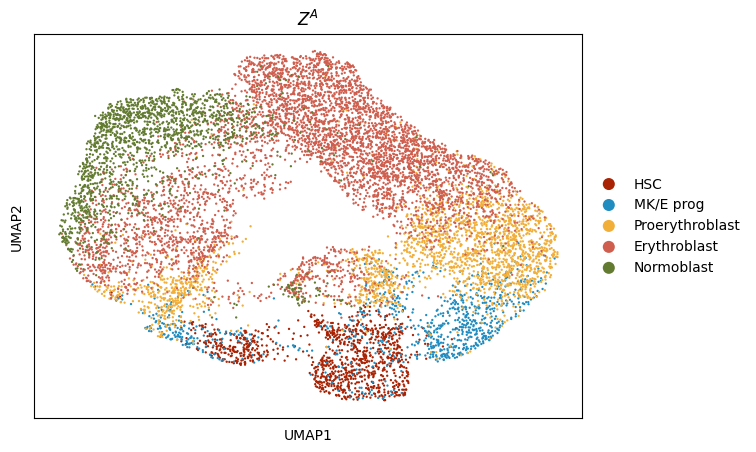

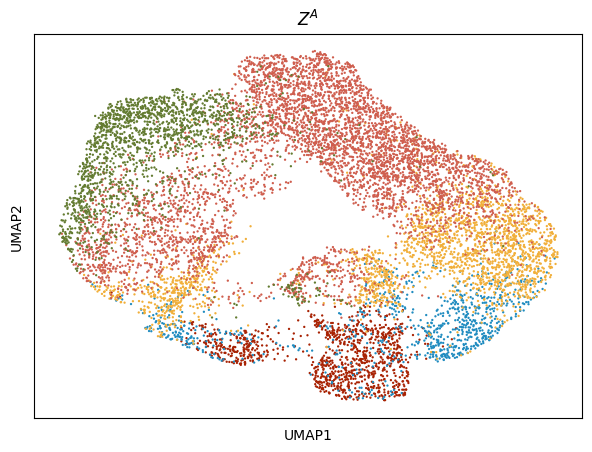

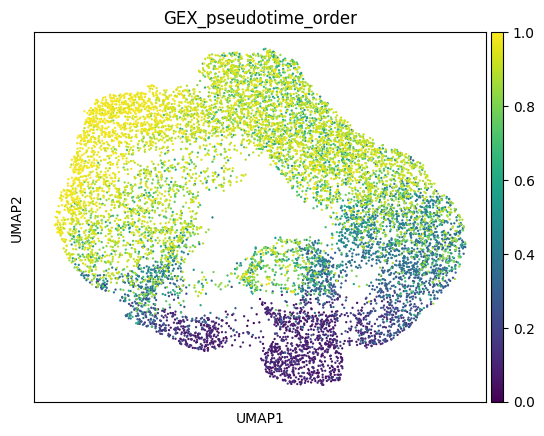

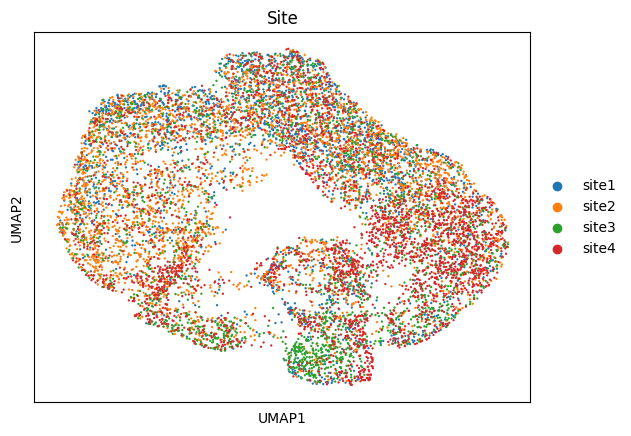

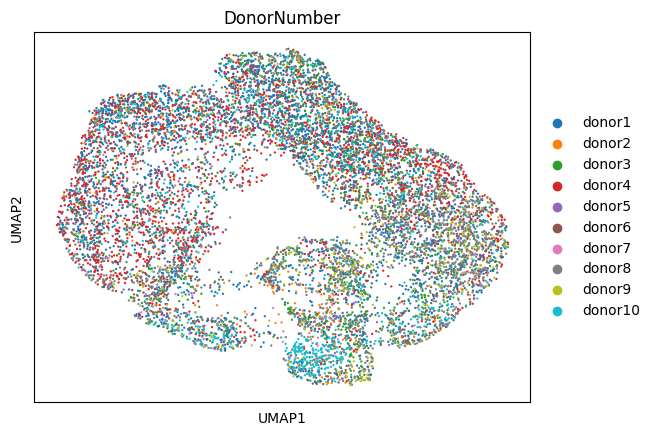

In [13]:
adata_mvi.obsm["latent"] = latent_acc_1
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{A}$',palette=colors)
plt.show()


sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{A}$',palette=colors,legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()

sc.pl.umap(adata_mvi, color=['Site'])
plt.show()

sc.pl.umap(adata_mvi, color=['DonorNumber'])
plt.show()

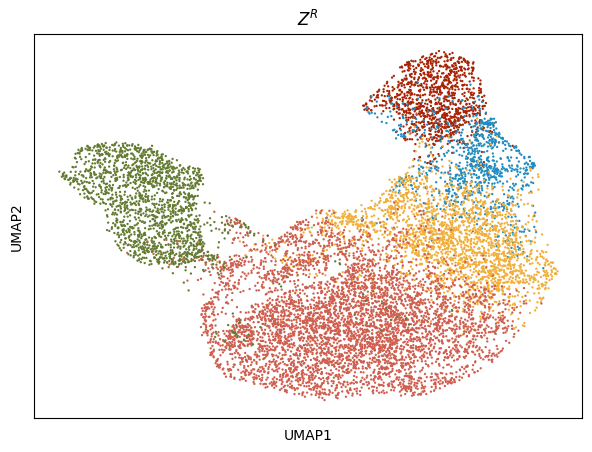

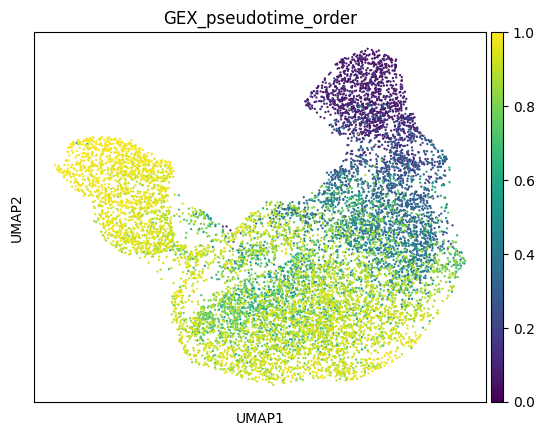

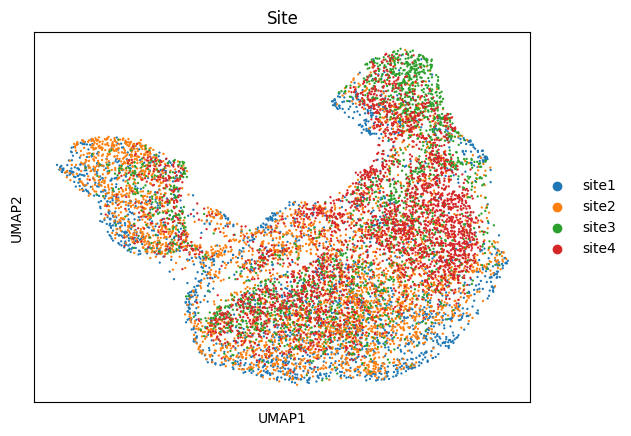

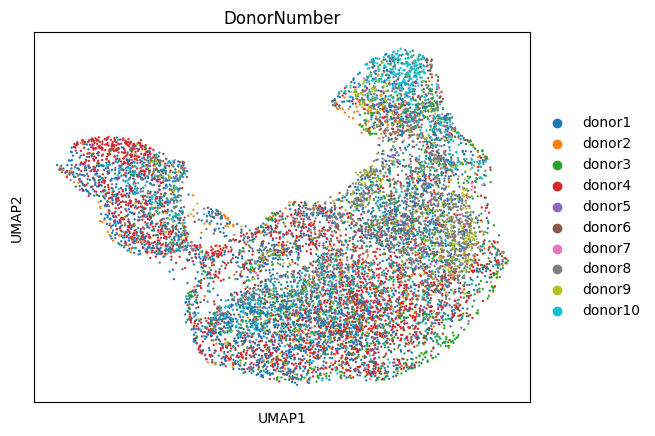

In [14]:
adata_mvi.obsm["latent"] = latent_expr_1
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{R}$',palette=colors,legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()

sc.pl.umap(adata_mvi, color=['Site'])
plt.show()

sc.pl.umap(adata_mvi, color=['DonorNumber'])
plt.show()

In [15]:
model.module.set_train_params(expr_train=True, acc_train=True)
model.module.set_finetune_params(2)
model.module.set_scale_params(1e6,1e8,5e5)
model.train(max_epochs=10)

Multiprocessing is handled by SLURM.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 10/10: 100%|██████████| 10/10 [01:37<00:00,  9.82s/it, loss=1.43e+05, v_num=1]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████| 10/10 [01:37<00:00,  9.79s/it, loss=1.43e+05, v_num=1]


In [36]:
model.save("../openproblem/neurips_GEX", overwrite=True)

In [9]:
model.load("../openproblem/neurips_GEX", adata_mvi)

INFO     File ../openproblem/neurips_GEX/model.pt already downloaded                                               


SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained

# UMAP

In [10]:
latent_expr_2, latent_acc_2,latent_atac_dep_2, latent_expr_dep_2, latent_atac_indep_2, latent_expr_indep_2, times  = model.get_latent_representation()

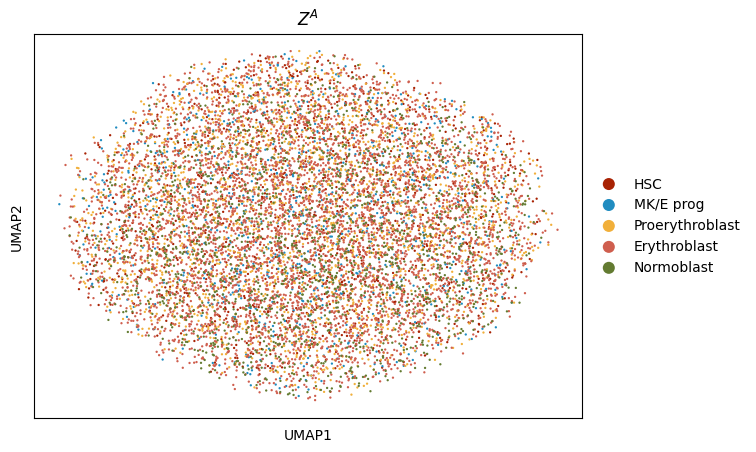

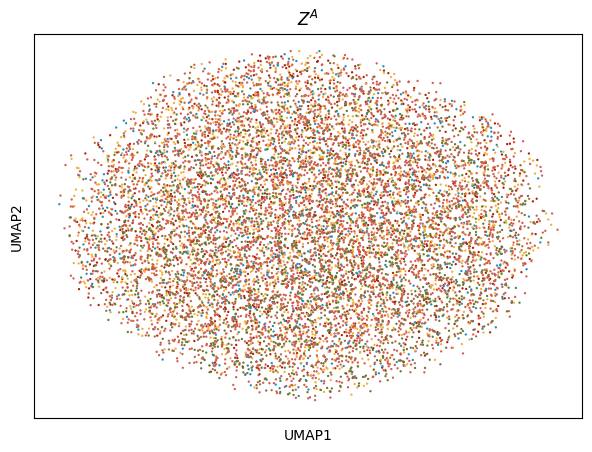

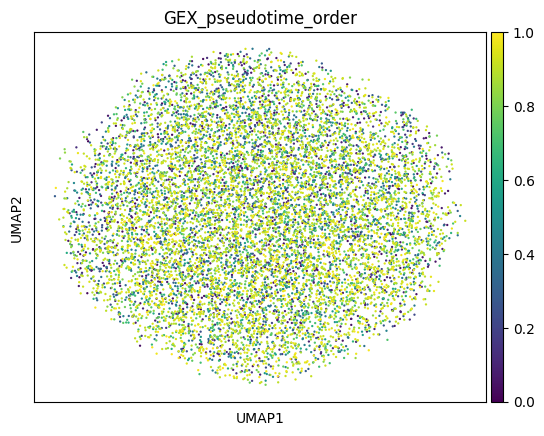

In [11]:
adata_mvi.obsm["latent"] = latent_acc_2
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])

sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{A}$',palette=colors)
plt.show()

sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{A}$',palette=colors,legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()

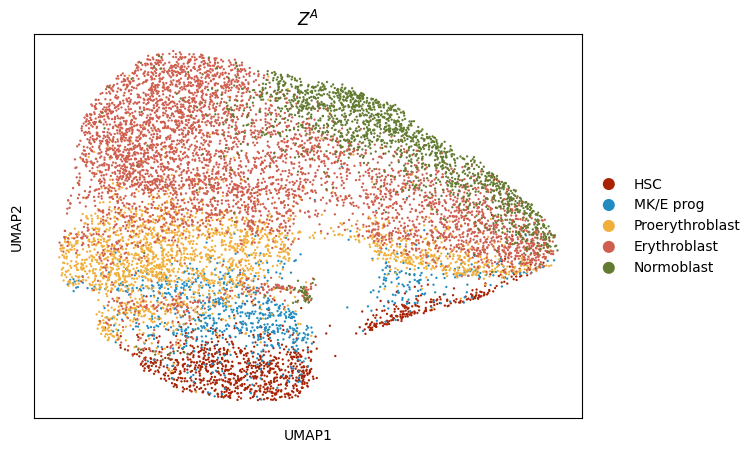

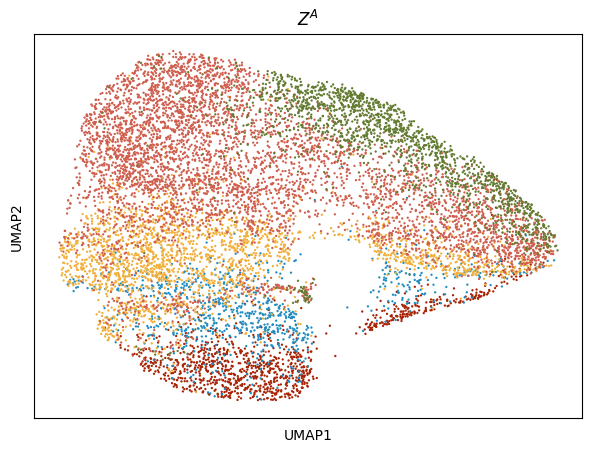

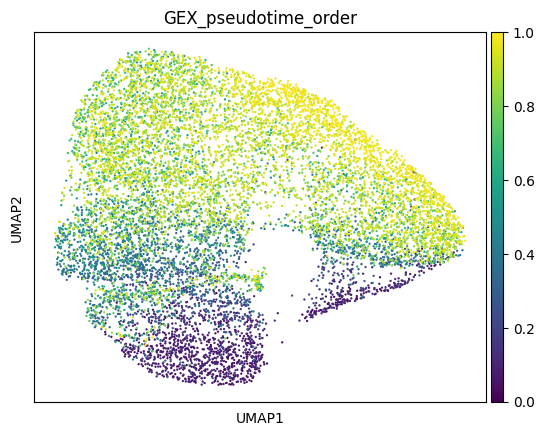

In [18]:
adata_mvi.obsm["latent"] = latent_acc_2
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])

sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{A}$',palette=colors)
plt.show()

sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{A}$',palette=colors,legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()

# sc.pl.umap(adata_mvi, color=['ATAC_pseudotime_order'])
# plt.show()


# sc.pl.umap(adata_mvi, color=['Site'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorBloodType'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorRace'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorSmoker'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorNumber'])
# plt.show()

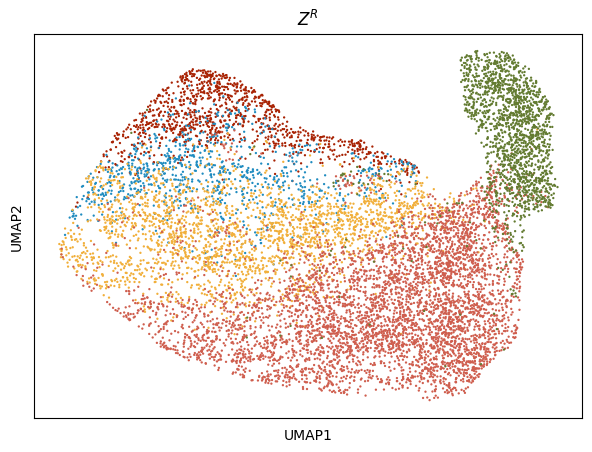

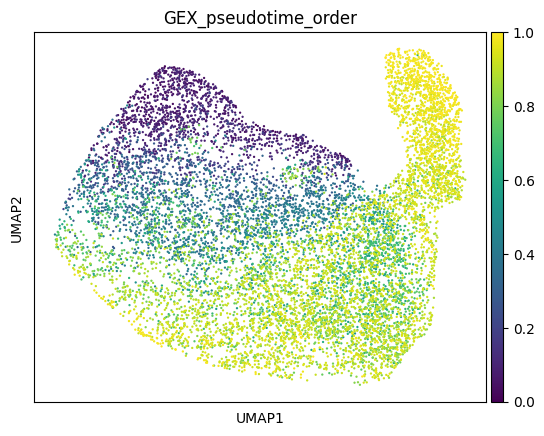

In [19]:
adata_mvi.obsm["latent"] = latent_expr_2
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{R}$',palette=colors,legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()

# sc.pl.umap(adata_mvi, color=['ATAC_pseudotime_order'])
# plt.show()


# sc.pl.umap(adata_mvi, color=['Site'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorBloodType'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorRace'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorSmoker'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorNumber'])
# plt.show()

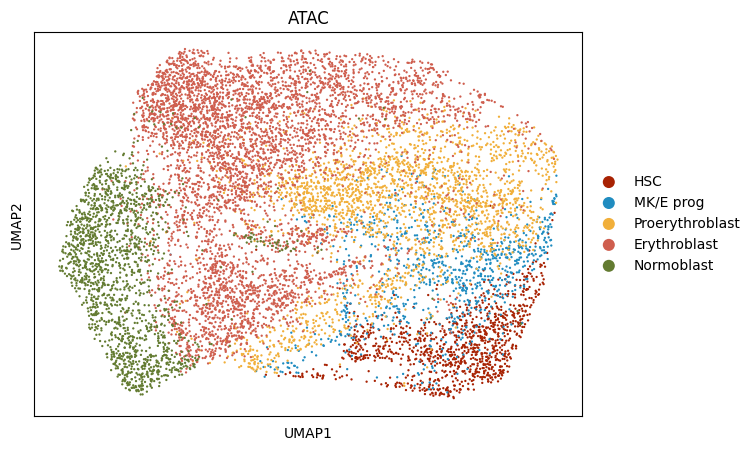

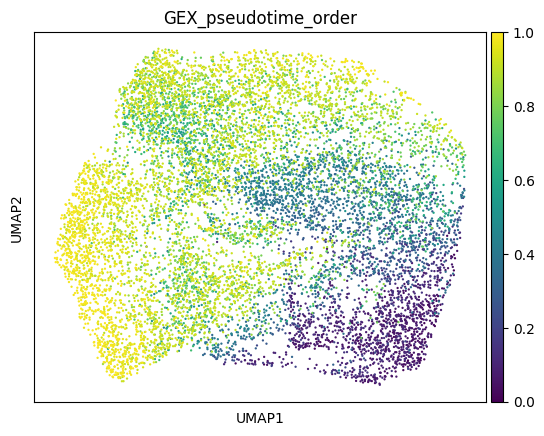

In [26]:
adata_mvi.obsm["latent"] = np.concatenate((latent_acc_2,latent_expr_2),axis=1) 
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = 'ATAC',palette=colors)
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()

# sc.pl.umap(adata_mvi, color=['ATAC_pseudotime_order'])
# plt.show()


# sc.pl.umap(adata_mvi, color=['Site'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorBloodType'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorRace'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorSmoker'])
# plt.show()

# sc.pl.umap(adata_mvi, color=['DonorNumber'])
# plt.show()

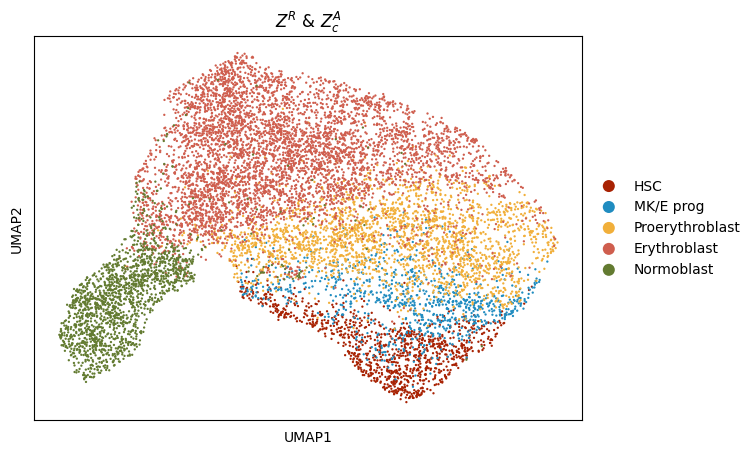

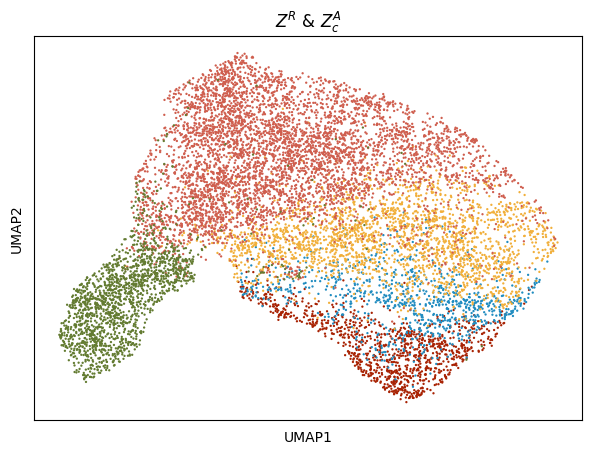

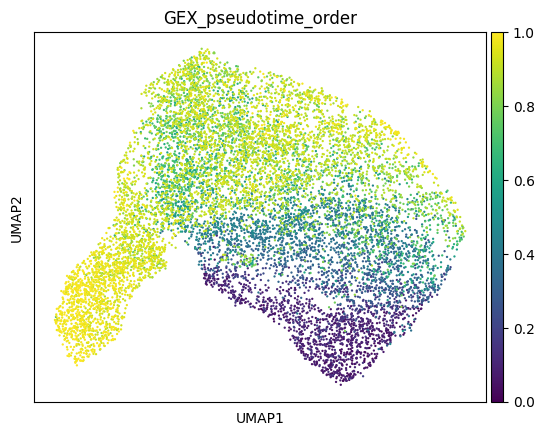

In [31]:
adata_mvi.obsm["latent"] = np.concatenate((latent_atac_dep_2,latent_expr_2),axis=1) 
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{R}$ & $Z^{A}_{c}$',palette=colors)
plt.show()

sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{R}$ & $Z^{A}_{c}$',palette=colors,legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()

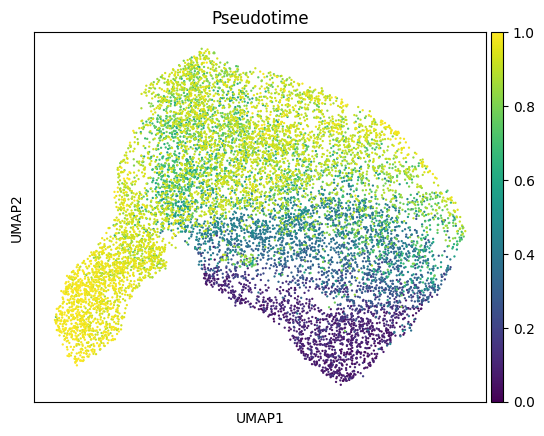

In [33]:
sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'],title = 'Pseudotime')
plt.show()

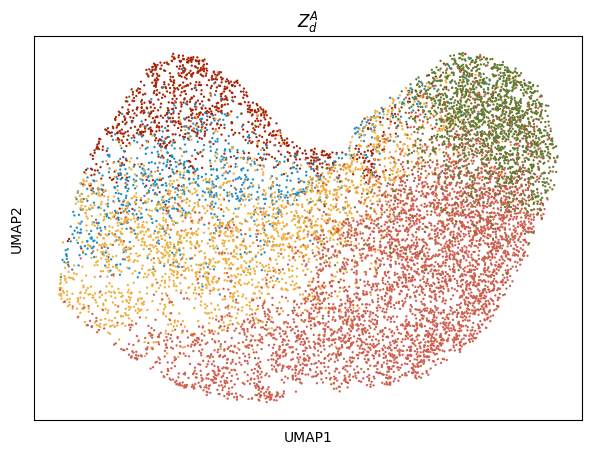

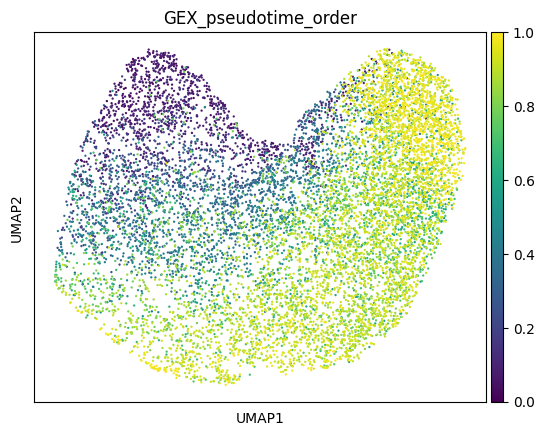

In [34]:
adata_mvi.obsm["latent"] = latent_atac_indep_2
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{A}_{d}$',palette=colors,
             legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()


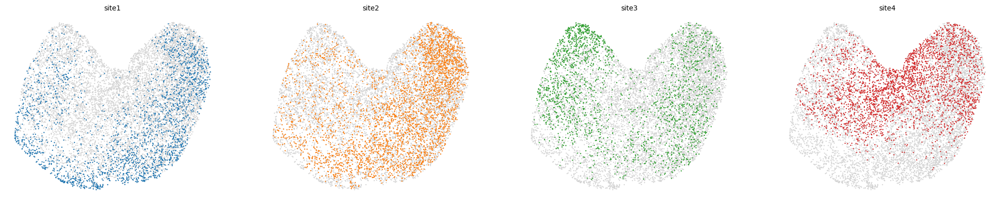

In [35]:
scv.pl.scatter(adata_mvi, groups=[[c] for c in adata_mvi.obs['Site'].cat.categories], color='Site', ncols=4)

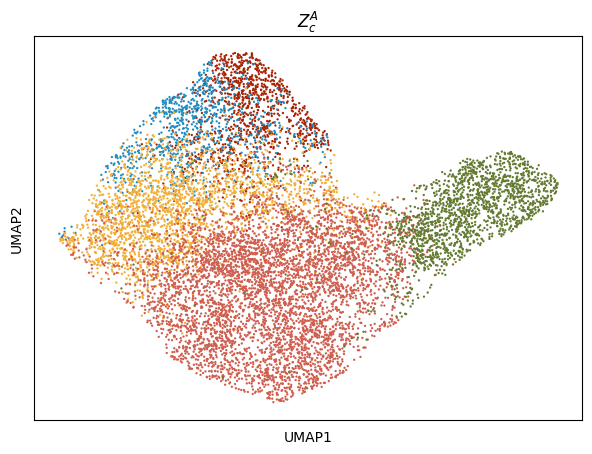

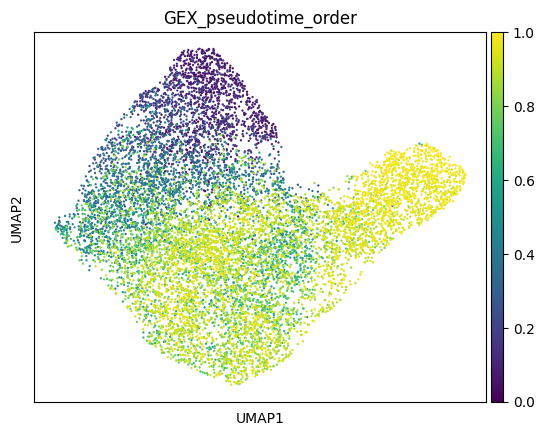

In [22]:
adata_mvi.obsm["latent"] = latent_atac_dep_2
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{A}_{c}$',palette=colors,
             legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()



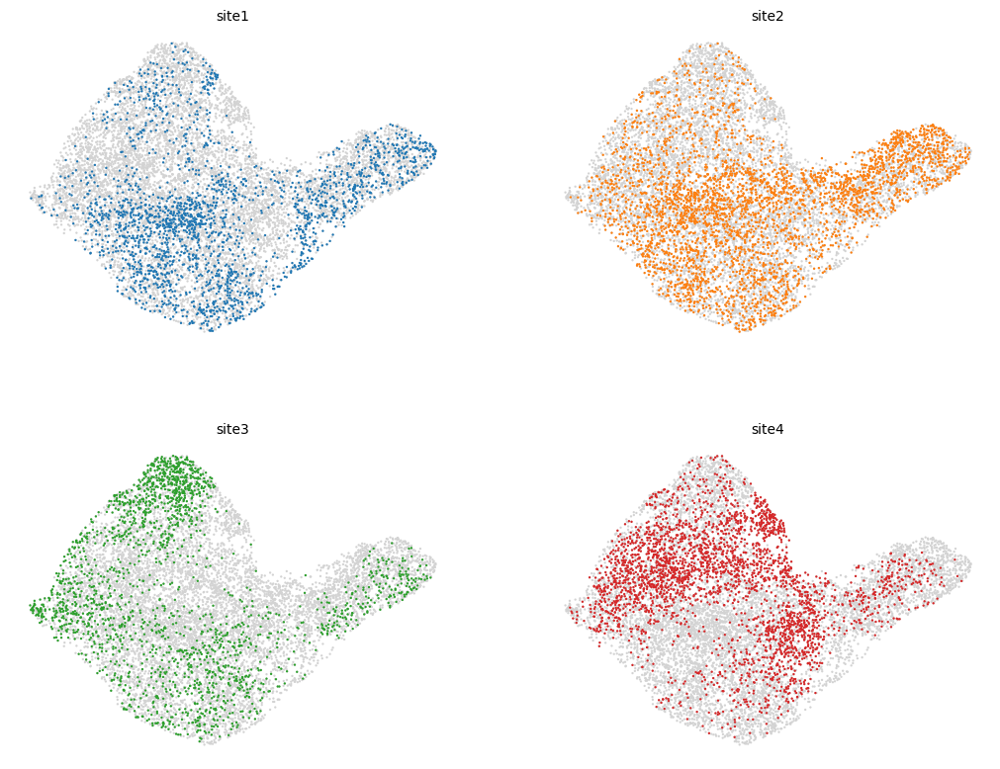

In [23]:
scv.pl.scatter(adata_mvi, groups=[[c] for c in adata_mvi.obs['Site'].cat.categories], color='Site', ncols=2)

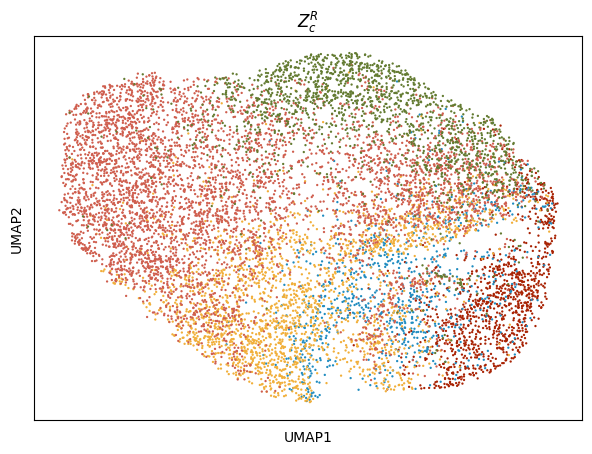

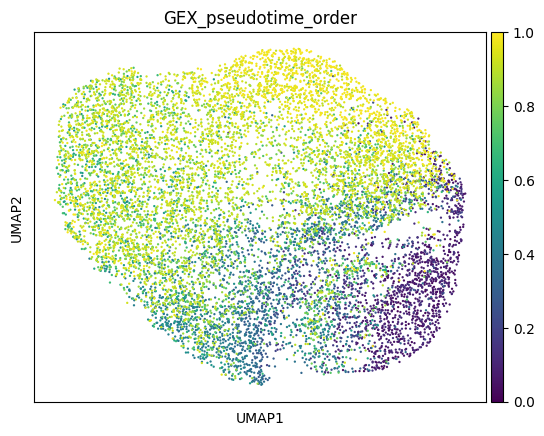

In [24]:
adata_mvi.obsm["latent"] = latent_expr_dep_2
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{R}_{c}$',palette=colors,
             legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()


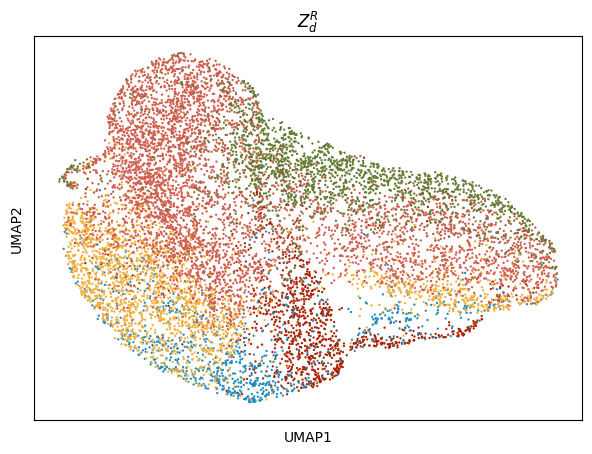

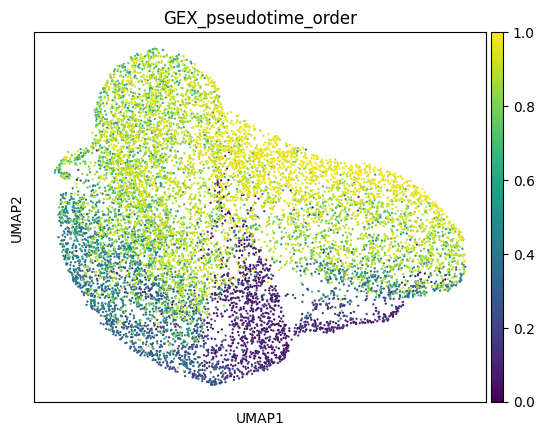

In [25]:
adata_mvi.obsm["latent"] = latent_expr_indep_2
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['cell_type'])
sc.pl.scatter(adata_mvi,color='cell_type',basis='umap',title = '$Z^{R}_{d}$',palette=colors,
             legend_loc = 'none')
plt.show()

sc.pl.umap(adata_mvi, color=['GEX_pseudotime_order'])
plt.show()

